<a href="https://colab.research.google.com/github/kennc05/household_electricity_forecasting/blob/main/3.%20K%20Nearest%20Neighbors.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#K-Nearest Neighbors

##1. Import libraries 

In [ ]:
# to access google drive folder
from google.colab import drive
drive.mount("/content/drive")
full_path = "/content/drive/MyDrive/Kenn @Newcastle Uni/20-21 - Year 3/CSC3032: Dissertation/Code/London Smart Meters/Datasets"

# import libraries needed 
import pandas as pd 
import numpy as np 
from matplotlib import pyplot as plt

#import Sklearn libraries 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler

# importing performance metrics
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score


# set pandas display options 
pd.options.display.max_columns = 60
pd.options.display.max_colwidth = 500

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##2. Features to use based on correlation analysis

In [ ]:
#All features except temperatureLow as it is redundant
all_individual_features = ['day_of_week', 'day_of_month', 'month',
       'Acorn_grouped_Adversity', 'Acorn_grouped_Affluent',
       'Acorn_grouped_Comfortable', 'temperatureHigh',
       'dewPoint', 'cloudCover', 'windSpeed', 'pressure', 'visibility',
       'humidity', 'uvIndex', 'moonPhase', 'weather_type_clear-day',
       'weather_type_cloudy', 'weather_type_fog',
       'weather_type_partly-cloudy-day', 'weather_type_partly-cloudy-night',
       'weather_type_wind', 'public_holiday']

all_acorn_features = ['day_of_week', 'day_of_month', 'month', 'temperatureHigh',
       'dewPoint', 'cloudCover', 'windSpeed', 'pressure', 'visibility',
       'humidity', 'uvIndex', 'moonPhase', 'weather_type_clear-day',
       'weather_type_cloudy', 'weather_type_fog',
       'weather_type_partly-cloudy-day', 'weather_type_partly-cloudy-night',
       'weather_type_wind', 'public_holiday']


#Top 8 from pearson correlations

#For all individual dataset only 
pearson_0 = ['Acorn_grouped_Affluent', 'humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'Acorn_grouped_Adversity', 
             'uvIndex', 'dewPoint', 'temperatureHigh']

pearson_1 = ['Acorn_grouped_Affluent', 'humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'Acorn_grouped_Adversity', 
             'uvIndex', 'dewPoint', 'temperatureHigh', 'public_holiday']

pearson_2 = ['Acorn_grouped_Affluent', 'humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'Acorn_grouped_Adversity', 
             'uvIndex', 'dewPoint', 'temperatureHigh', 'month', 'day_of_week']

pearson_3 = ['Acorn_grouped_Affluent', 'humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'Acorn_grouped_Adversity', 
             'uvIndex', 'dewPoint', 'temperatureHigh',  'month', 'day_of_week', 'public_holiday']
             


#----
#For acorn datasets
pearson_4 = ['humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'weather_type_fog', 
             'visibility', 'uvIndex', 'dewPoint', 'temperatureHigh']

pearson_5 = ['humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'weather_type_fog', 
             'visibility', 'uvIndex', 'dewPoint', 'temperatureHigh', 'public_holiday']
        
pearson_6 = ['humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'weather_type_fog', 
             'visibility', 'uvIndex', 'dewPoint', 'temperatureHigh', 'day_of_week', 'month']


pearson_7 = ['humidity', 'cloudCover', 'weather_type_partly-cloudy-night', 'weather_type_fog', 
             'visibility', 'uvIndex', 'dewPoint', 'temperatureHigh', 'day_of_week', 'month', 'public_holiday']


#For individual only
mutual_information_0 = ['month', 'Acorn_grouped_Affluent', 'temperatureHigh', 'dewPoint', 'windSpeed', 
                        'pressure', 'visibility', 'uvIndex']

mutual_information_1 = ['month', 'Acorn_grouped_Affluent', 'temperatureHigh', 'dewPoint', 'windSpeed', 
                        'pressure', 'visibility', 'uvIndex', 'public_holiday']

mutual_information_2 = ['month', 'Acorn_grouped_Affluent', 'temperatureHigh', 'dewPoint', 'windSpeed', 
                        'pressure', 'visibility', 'uvIndex', 'day_of_week', 'month']

mutual_information_3 = ['month', 'Acorn_grouped_Affluent', 'temperatureHigh', 'dewPoint', 'windSpeed', 
                        'pressure', 'visibility', 'uvIndex', 'day_of_week', 'month', 'public_holiday']                                            


#----
#For acorn datasets
mutual_information_4 = ['month', 'temperatureHigh', 'dewPoint', 'windSpeed', 'pressure', 'visibility', 
                        'humidity', 'uvIndex']

mutual_information_5 = ['month', 'temperatureHigh', 'dewPoint', 'windSpeed', 'pressure', 'visibility', 
                        'humidity', 'uvIndex', 'public_holiday']

mutual_information_6 = ['day_of_week', 'month', 'temperatureHigh', 'dewPoint', 'windSpeed', 'pressure', 'visibility', 
                        'humidity', 'uvIndex', 'day_of_week', 'month']

mutual_information_7 = ['day_of_week', 'month', 'temperatureHigh', 'dewPoint', 'windSpeed', 'pressure', 'visibility', 
                        'humidity', 'uvIndex', 'day_of_week', 'month', 'public_holiday']


#Calendar attributes worth considering: 'day_of_week',	'day_of_month',	'month', 'public_holiday'


#For use when iterating through each of the feature selection and household groups
individual_feature_groups_pearson = [pearson_0, pearson_1, pearson_2, pearson_3]
individual_feature_groups_mutual_information = [mutual_information_0, mutual_information_1, mutual_information_2, mutual_information_3]

#All acorn groups
acorn_groups_pearson = [pearson_4, pearson_5, pearson_6, pearson_7] 
acorn_groups_mutual_information = [mutual_information_4, mutual_information_5, mutual_information_6, mutual_information_7]


#Households to test
affluent_1 = pd.read_csv(full_path + '/daily/individual_households_test/affluent/household_1.csv')
affluent_2 = pd.read_csv(full_path + '/daily/individual_households_test/affluent/household_2.csv')
affluent_3 = pd.read_csv(full_path + '/daily/individual_households_test/affluent/household_3.csv')

comfortable_1 = pd.read_csv(full_path + '/daily/individual_households_test/comfortable/household_1.csv')
comfortable_2 = pd.read_csv(full_path + '/daily/individual_households_test/comfortable/household_2.csv')
comfortable_3 = pd.read_csv(full_path + '/daily/individual_households_test/comfortable/household_3.csv')

adversity_1 = pd.read_csv(full_path + '/daily/individual_households_test/adversity/household_1.csv')
adversity_2 = pd.read_csv(full_path + '/daily/individual_households_test/adversity/household_2.csv')
adversity_3 = pd.read_csv(full_path + '/daily/individual_households_test/adversity/household_3.csv')


#Households to test
affluent_households_test = [affluent_1, affluent_2, affluent_3] 
comfortable_households_test = [comfortable_1, comfortable_2, comfortable_3] 
adversity_households_test = [adversity_1, adversity_2, adversity_3]

##3. Helper functions

In [ ]:
#Create a function to see how well the model performs over different values of K
def optimise_k(k_range, X_train, X_test, y_train, y_test):
    
    #Store the results 
    mae_metrics = []
    mape_metrics = []
    mse_metrics = []
    rmse_metrics = []
    r2_metrics = []

    #Apply feature scaling to all of the features 
    scaler = MinMaxScaler()

    #Apply scaling to X_train and X_test
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.fit_transform(X_test)
    
    print("-- Model performance per K: --\n")
    print("{:<15} {:<23} {:<23} {:<23} {:<23} {:<23}".format('K Neighbors', 'MAE', 'MAPE', 'MSE', 'RMSE', 'R2'))

    for k in k_range: 
        model = KNeighborsRegressor(n_neighbors = k)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)
        
        mae_metrics.append(mae)
        mape_metrics.append(mape)
        mse_metrics.append(mse)
        rmse_metrics.append(rmse)
        r2_metrics.append(r2)

        print("{:<15} {:<23} {:<23} {:<23} {:<23} {:<23}".format(k, mae, mape, mse, rmse, r2))
        
    #Then plot - MAPE and MSE not included as values are too large and skew the plot
    plt.plot(k_range, mae_metrics, label='MAE Score')
    #plt.plot(k_range, mape_metrics, label='MAPE Score')
    #plt.plot(k_range, mse_metrics, label='MSE Score')
    plt.plot(k_range, rmse_metrics, label='RMSE Score')
    plt.plot(k_range, r2_metrics, label='R2 Score')

    plt.plot(title='Results for different values of K',
            xlabel='Number of Neighbors',
           ylabel='Accuracy')
    plt.legend()
    plt.show()    

#For specific K value only after optimising
def run_model(X_train, X_test, y_train, y_test, k_neighbors, feature_groups, household_groups):
  #Apply feature scaling 
  scaler = MinMaxScaler()

  #Arrays to store results
  household_1_predictions = []
  household_2_predictions = []
  household_3_predictions = []


  print("-- Model performance per feature group: --\n")
  print("{:<15} {:<23} {:<23} {:<23} {:<23} {:<23}".format('Feature group', 'MAE', 'MAPE', 'MSE', 'RMSE', 'R2'))

  for i in range(0, len(feature_groups)):
    #Scale the dataset first
    X_train_scaled = scaler.fit_transform(X_train[feature_groups[i]])
    X_test_scaled = scaler.fit_transform(X_test[feature_groups[i]])

    #Fit to model 
    model = KNeighborsRegressor(n_neighbors = k_neighbors)
    model.fit(X_train_scaled, y_train)

    y_pred = model.predict(X_test_scaled)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    print("{:<15} {:<23} {:<23} {:<23} {:<23} {:<23}".format(i, mae, mape, mse, rmse, r2))

    #Scale the dataset for each household also 
    household_1_scaled = scaler.fit_transform(household_groups[0][feature_groups[i]])
    household_2_scaled = scaler.fit_transform(household_groups[1][feature_groups[i]])
    household_3_scaled = scaler.fit_transform(household_groups[2][feature_groups[i]])

    #Then make predictions for that household
    household_1_predictions.append(model.predict(household_1_scaled))
    household_2_predictions.append(model.predict(household_2_scaled))
    household_3_predictions.append(model.predict(household_3_scaled))

  return household_1_predictions, household_2_predictions, household_3_predictions


#Function to visualise results quickly 
def visualise_results (household_data, household_predictions):
  household_data_consumption = household_data['energy_sum'] 
  household_data['day']=  pd.to_datetime(household_data['day'],format='%Y-%m-%d')

  #Clear any existing plots
  plt.clf()
  plt.figure(figsize = (25,5))
  plt.plot(household_data['day'], household_data_consumption, label='Actual consumption')

  #Loop through each of the household predictions in the 2D array for each feature group, and plot
  for i in range(0, len(household_predictions)):
    plt.plot(household_data['day'], household_predictions[i], label='Feature group: ' +str(i))

  plt.xlabel('Day')
  plt.ylabel('Electricity consumed (kWh)')
  plt.legend()
  plt.show()


#Get the performance metrics 
#MAE, MAPE, MSE, RMSE, R2
def get_performance(household_consumption, household_predictions):
  household_consumption = household_consumption['energy_sum']

  print("-- Household forecasting performance per feature group: --\n")
  print("{:<15} {:<23} {:<23} {:<23} {:<23} {:<23}".format('Feature group', 'MAE', 'MAPE', 'MSE', 'RMSE', 'R2'))

  for i in range(0, len(household_predictions)):
    mae = mean_absolute_error(household_consumption, household_predictions[i])
    mape = mean_absolute_percentage_error(household_consumption, household_predictions[i])
    mse = mean_squared_error(household_consumption, household_predictions[i])
    rmse = np.sqrt(mse)
    r2 = r2_score(household_consumption, household_predictions[i])
    print("{:<15} {:<23} {:<23} {:<23} {:<23} {:<23}".format(i, mae, mape, mse, rmse, r2))



#Save to .csv file for comparasion between models later
def save_best_results(household_predictions, best_feature_group, acorn_name, household_name):
  best_household_predictions = household_predictions[best_feature_group]
  #best_household_predictions.to_csv(full_path + '/daily/individual_households_test/'+acorn_name+'/'+household_name+'_model1.csv', index=False)
  np.savetxt(full_path + '/daily/individual_households_test/'+acorn_name+'/'+household_name+'_predictions_model2.csv', best_household_predictions, delimiter=",")


## All acorn groups combined


### 1.1 Load the dataset

In [ ]:
X_train = pd.read_csv(full_path + '/daily/daily_individual_consumption_final_training.csv')
y_train = X_train['energy_sum']

X_test = pd.read_csv(full_path + '/daily/daily_individual_consumption_final_testing.csv')
y_test = X_test['energy_sum']

#Drop the unneeded energy_sum column in the X dataset
X_train.drop(['energy_sum'], axis=1, inplace=True)
X_test.drop(['energy_sum'], axis=1, inplace=True)


X_train.head()

,LCLid,day_x,day_of_week,day_of_month,month,Acorn_grouped_Adversity,Acorn_grouped_Affluent,Acorn_grouped_Comfortable,temperatureLow,temperatureHigh,dewPoint,cloudCover,windSpeed,pressure,visibility,humidity,uvIndex,moonPhase,weather_type_clear-day,weather_type_cloudy,weather_type_fog,weather_type_partly-cloudy-day,weather_type_partly-cloudy-night,weather_type_wind,public_holiday,day_y
0,MAC004552,2012-01-01,6,1,1,0.0,1.0,0.0,5.18,12.56,9.45,0.58,4.92,1004.82,12.33,0.90,1.0,0.26,0.0,0.0,0.0,1.0,0.0,0.0,0,733
1,MAC004552,2012-01-02,0,2,1,0.0,1.0,0.0,4.69,7.57,2.80,0.21,4.81,1008.49,13.23,0.81,1.0,0.29,0.0,0.0,0.0,1.0,0.0,0.0,1,733
2,MAC004552,2012-01-03,1,3,1,0.0,1.0,0.0,5.27,12.41,5.73,0.48,8.47,1003.23,10.80,0.82,1.0,0.32,0.0,0.0,0.0,0.0,0.0,1.0,0,733
3,MAC004552,2012-01-04,2,4,1,0.0,1.0,0.0,8.16,8.21,3.38,0.49,7.98,1014.07,12.62,0.78,1.0,0.35,0.0,0.0,0.0,0.0,0.0,1.0,0,733
4,MAC004552,2012-01-05,3,5,1,0.0,1.0,0.0,4.40,11.04,4.28,0.47,9.49,1004.74,12.92,0.70,1.0,0.38,0.0,0.0,0.0,0.0,0.0,1.0,0,733


### 1.2 Fit and Plot results on various acorn household groupings

#### Affluent households - pearson

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.319104236438485       171814987625190.8       86.4213676668882        9.296309357314234       -0.00518222967025217   
1               6.30758713009702        172212419423963.88      86.1556033893268        9.282004276519528       -0.0020910782999616906 
2               6.2778629424964105      169350359221078.28      85.83656057947948       9.264802241790134       0.0016197651131939494  
3               6.305320197735272       170536696150358.03      86.23236380844789       9.286138261325204       -0.0029838923264646766 


<Figure size 432x288 with 0 Axes>

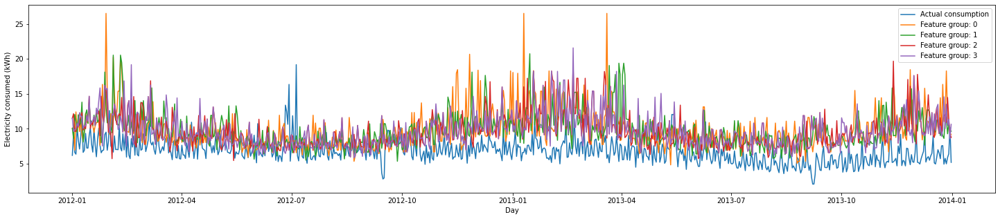

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.322512414051842       0.551166704114672       18.375486520248668      4.286663798369155       -5.091192172497459     
1               3.235544519527058       0.538221539541063       16.28749164398873       4.035776461102464       -4.399053870065333     
2               3.203329513278763       0.5329151750762382      16.165321057647237      4.020612025257751       -4.358556192988173     
3               3.163621281464302       0.5253727316576029      15.464167405294004      3.9324505598028825      -4.12613450258962      


In [ ]:
#Pass in the dataset, run the model and then plot the results
household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, individual_feature_groups_pearson, affluent_households_test)


#Pearson on individual results - all
visualise_results(affluent_households_test[0], household_1_predictions)

get_performance(affluent_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

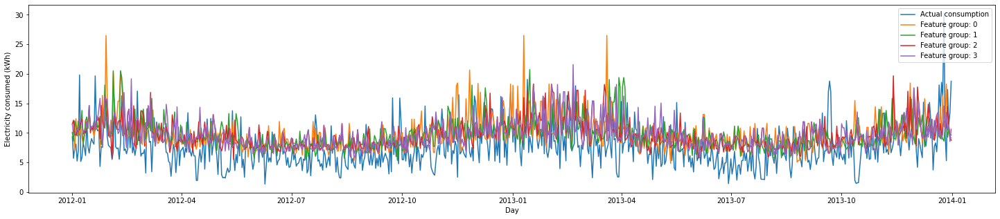

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.451171168358345       0.6353381223616813      19.58648212526464       4.425661772578723       -0.665495311208715     
1               3.3899278770350163      0.6261834721010339      17.868013674602444      4.227057330413492       -0.5193689609670773    
2               3.2526494781718966      0.6006790363526462      16.409500668101263      4.05086418781243        -0.39534737515451934   
3               3.2898089142974074      0.6129712414855965      17.038815401059136      4.127810000600698       -0.4488598298318156    


In [ ]:
#Pearson on individual results - all
visualise_results(affluent_households_test[1], household_2_predictions)

get_performance(affluent_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

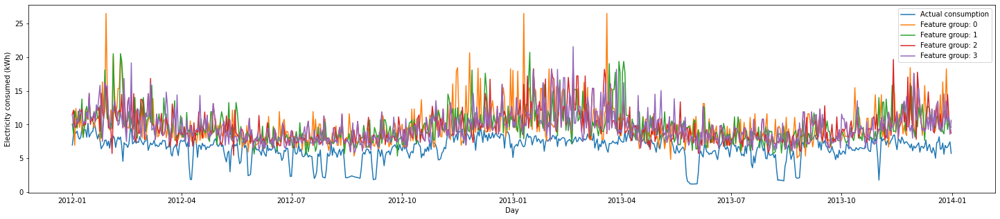

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.3110537508140063      0.6812119077737688      17.88430223081138       4.2289835931121065      -5.204872345329229     
1               3.1781420638562987      0.652154780195661       15.355722267825273      3.918637807685889       -4.3275937306648045    
2               3.203744065484311       0.6553441403988856      15.47617187490861       3.9339765981648402      -4.369383140525569     
3               3.1618903130331972      0.6457342420502205      14.97725030669497       3.870045258998268       -4.1962847103411525    


In [ ]:
#Pearson on individual results - all
visualise_results(affluent_households_test[2], household_2_predictions)

get_performance(affluent_households_test[2], household_2_predictions)

#### Affluent households - mutual information

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.398829834343043       169768603662339.2       89.13451858243116       9.441107910750262       -0.036739368377306736  
1               6.39350942395731        171935273320048.88      88.8836709349551        9.427813687963669       -0.033821714972775974  
2               6.323098489822452       168480520363915.9       88.10774937440986       9.386572823688626       -0.02479683391229126   
3               6.506002768907045       174450674628561.72      90.89431626398034       9.533851072047451       -0.05720788681277589   


<Figure size 432x288 with 0 Axes>

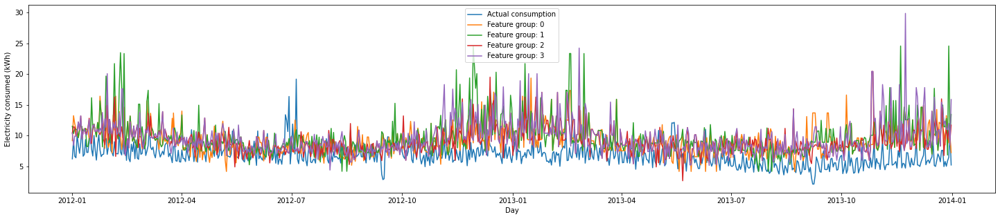

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.7663840830923148      0.4664839557357958      12.353292342111216      3.5147250734746263      -3.09492709408939      
1               3.211255389331514       0.5261594336546291      18.299552604500477      4.277797634823377       -5.066021243133342     
2               2.726439562874033       0.4541017102575414      11.911158401352381      3.4512546126520975      -2.948366468541979     
3               3.173819371859937       0.5241482294617665      16.895546860308293      4.11041930468271        -4.600614855675735     


In [ ]:
#Pass in the dataset, run the model and then plot the results
household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, individual_feature_groups_mutual_information, affluent_households_test)


#Pearson on individual results - all
visualise_results(affluent_households_test[0], household_1_predictions)

get_performance(affluent_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

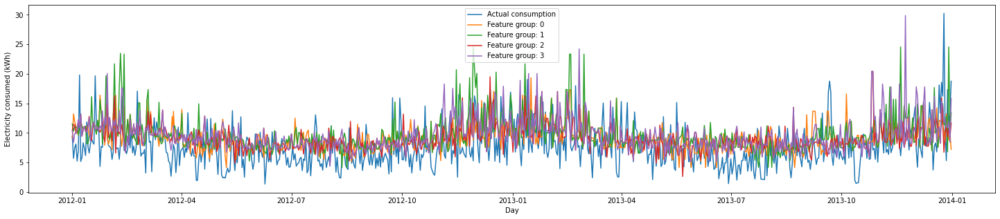

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.0383778084583906      0.5504990151054043      14.775000257378485      3.8438262522359783      -0.2563610705788719    
1               3.404141884429286       0.6127553969379601      19.32729510504534       4.396281963778636       -0.6434558880932906    
2               2.96764438526603        0.5437349352673428      14.033276596488664      3.7461015197787506      -0.19329015914495518   
3               3.2538101881400645      0.5903903816774448      17.444633780973522      4.176677361369145       -0.48336774220868417   


In [ ]:
#Mutual information on individual results - all
visualise_results(affluent_households_test[1], household_2_predictions)

get_performance(affluent_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

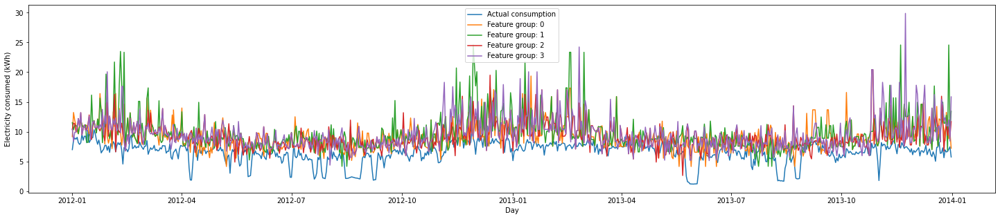

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.693994269968168       0.5615823847656488      11.373307969488915      3.3724335381870634      -2.9459143098809437    
1               3.223185721418827       0.6486186953280075      18.098981091849126      4.25428972824479        -5.279354140077978     
2               2.7059238745884495      0.584828194735956       11.663137706906742      3.415133629436298       -3.0464693384947896    
3               3.1068525696862213      0.6390167165886659      16.21588581621989       4.02689530733292        -4.626023322438253     


In [ ]:
#Mutual information on individual results - all
visualise_results(affluent_households_test[2], household_2_predictions)

get_performance(affluent_households_test[2], household_2_predictions)

#### Comfortable households - pearson



-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.319104236438485       171814987625190.8       86.4213676668882        9.296309357314234       -0.00518222967025217   
1               6.30758713009702        172212419423963.88      86.1556033893268        9.282004276519528       -0.0020910782999616906 
2               6.2778629424964105      169350359221078.28      85.83656057947948       9.264802241790134       0.0016197651131939494  
3               6.305320197735272       170536696150358.03      86.23236380844789       9.286138261325204       -0.0029838923264646766 


<Figure size 432x288 with 0 Axes>

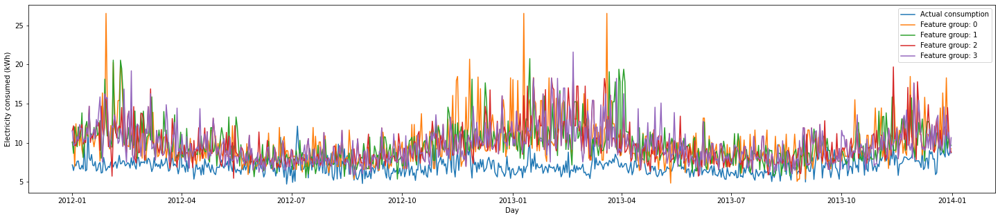

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.959925147166894       0.4340668806866619      15.141654021927776      3.8912278296095404      -10.116880041723956    
1               2.845992268885857       0.41919699040450764     13.235367904400679      3.638044516550159       -8.717300176600718     
2               2.8176653940427467      0.41501491752149466     13.057084110247398      3.613458746166531       -8.58640565542653      
3               2.8208502956161894      0.41390130889916865     12.66484720613835       3.5587704626933094      -8.298428489616061     


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, individual_feature_groups_pearson, comfortable_households_test)

#Pearson on individual results - all
visualise_results(comfortable_households_test[0], household_1_predictions)

get_performance(comfortable_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

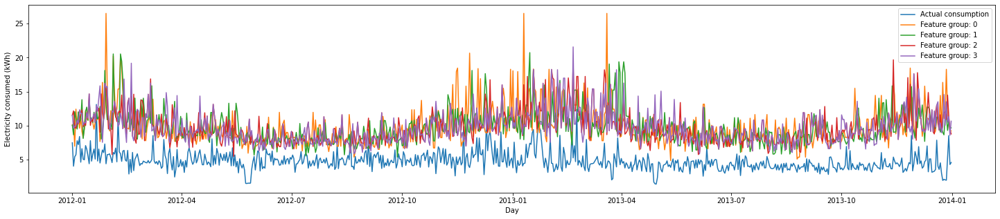

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.066054478926785       1.218541405994968       33.531245569451535      5.790617028387522       -16.114162596289603    
1               4.97761173157799        1.1977222756238362      30.94531361806087       5.562851213007667       -14.794317206491153    
2               4.955287584774897       1.192323401589879       30.65990119435685       5.537138357884589       -14.648644281333793    
3               4.941822010004548       1.199640298123092       30.615022386951605      5.533084346632681       -14.625738385831939    


In [ ]:
visualise_results(comfortable_households_test[1], household_2_predictions)

get_performance(comfortable_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

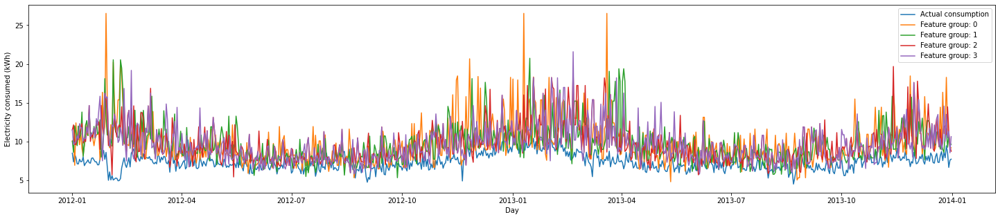

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.564426465238745       0.35566266245371325     12.303327314770648      3.50760991485237        -9.98178968131768      
1               2.454349339954525       0.34235248556880854     10.598684180836642      3.2555620376267815      -8.460247426964148     
2               2.415787812578445       0.33514972234794943     10.18969149219463       3.192129617073002       -8.095185881176366     
3               2.4261334230559344      0.3379711038377546      10.102667335981625      3.1784693385309892      -8.017509253035454     


In [ ]:
visualise_results(comfortable_households_test[2], household_3_predictions)

get_performance(comfortable_households_test[2], household_3_predictions)

#### Comfortable households - mutual information



-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.398829834343043       169768603662339.2       89.13451858243116       9.441107910750262       -0.036739368377306736  
1               6.39350942395731        171935273320048.88      88.8836709349551        9.427813687963669       -0.033821714972775974  
2               6.323098489822452       168480520363915.9       88.10774937440986       9.386572823688626       -0.02479683391229126   
3               6.506002768907045       174450674628561.72      90.89431626398034       9.533851072047451       -0.05720788681277589   


<Figure size 432x288 with 0 Axes>

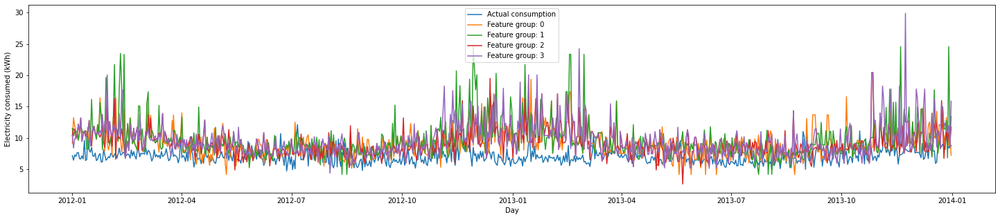

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.4036325605638926      0.35686217862648867     9.740772016917237       3.1210209895028322      -6.151596111562967     
1               2.8908854939972715      0.4238232449981077      16.153843901790303      4.019184482179227       -10.860021673251348    
2               2.380612460190996       0.35131326279336605     9.363995925183687       3.060064692973612       -5.874970149278684     
3               2.7509774448749433      0.4038554067083665      13.662127324285356      3.6962315030697623      -9.030623494559453     


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, individual_feature_groups_mutual_information, comfortable_households_test)

#Pearson on individual results - all
visualise_results(comfortable_households_test[0], household_1_predictions)

get_performance(comfortable_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

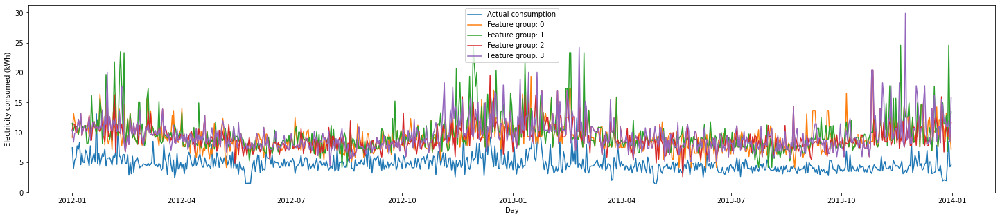

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               4.3927348808822195      1.0681090532727395      24.871552067092825      4.987138665316298       -11.694302847076484    
1               4.967241474506594       1.1833835676798408      33.55568515244476       5.792726918511243       -16.126636424506486    
2               4.402668668240109       1.0608688513363465      24.24425274429592       4.923845320914937       -11.374132736346409    
3               4.863628832096408       1.1691129170481067      31.2511873394042        5.590276141605547       -14.950433464986812    


In [ ]:
visualise_results(comfortable_households_test[1], household_2_predictions)

get_performance(comfortable_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

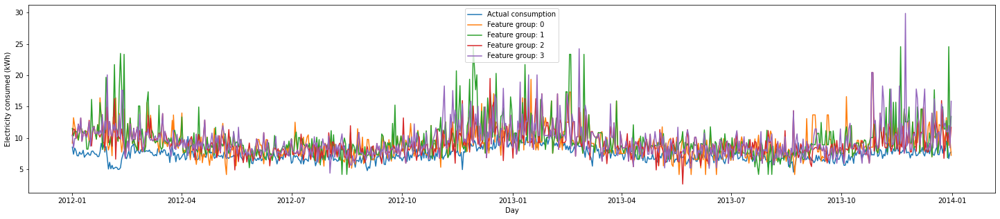

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.0101968161891772      0.2810926564419026      7.218695973051479       2.6867631032622654      -5.44331398501073      
1               2.4746461133151434      0.3438332019724199      13.323849431040705      3.6501848488865196      -10.89269442759362     
2               1.9747748977899042      0.27683089558600027     7.022822967596564       2.6500609365817542      -5.268480292049391     
3               2.370963801837199       0.3293946731535223      11.21187021263371       3.3484130887083974      -9.007569290752402     


In [ ]:
visualise_results(comfortable_households_test[2], household_3_predictions)

get_performance(comfortable_households_test[2], household_3_predictions)

#### Adversity households - pearson


-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.319104236438485       171814987625190.8       86.4213676668882        9.296309357314234       -0.00518222967025217   
1               6.30758713009702        172212419423963.88      86.1556033893268        9.282004276519528       -0.0020910782999616906 
2               6.2778629424964105      169350359221078.28      85.83656057947948       9.264802241790134       0.0016197651131939494  
3               6.305320197735272       170536696150358.03      86.23236380844789       9.286138261325204       -0.0029838923264646766 


<Figure size 432x288 with 0 Axes>

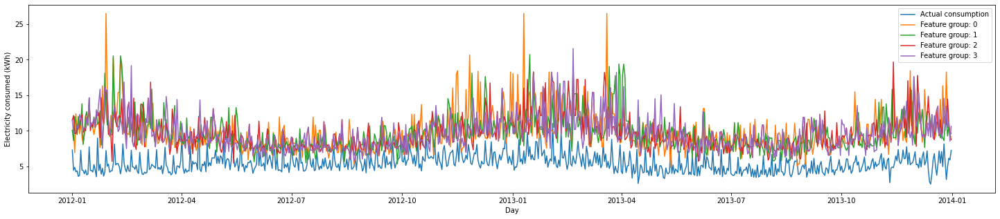

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               4.37515452304684        0.870783779080336       26.355540739622565      5.13376477252538        -13.713735342185798    
1               4.270209548212824       0.8568001472092301      24.303341385223888      4.92984192294478        -12.56803628526487     
2               4.245843200300136       0.8488200721570499      23.793245089062115      4.87783200705622        -12.283260420679023    
3               4.219100498108231       0.8491515034774574      23.640124635209833      4.862111129459079       -12.197776542517845    


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, individual_feature_groups_pearson, adversity_households_test)

#Pearson on individual results - all
visualise_results(adversity_households_test[0], household_1_predictions)
get_performance(adversity_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

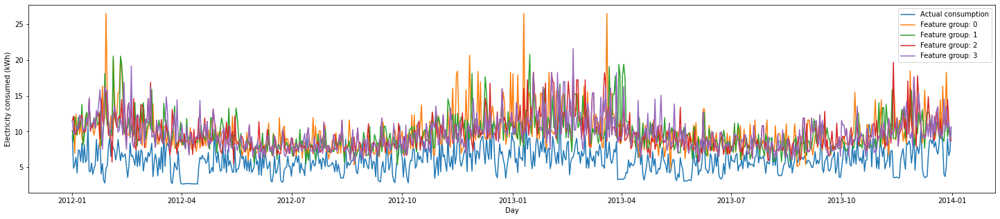

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.894226648412915       0.7737340133552812      22.71536776022622       4.766064179197151       -6.01868622353246      
1               3.8188613010277397      0.7700643937262678      21.16944797485203       4.60102683917971        -5.541021674368056     
2               3.8000445664120055      0.7599447200252786      20.602537040555536      4.539001766969863       -5.365855240501917     
3               3.793192723992724       0.7595111073868172      20.366304671669223      4.512904239142375       -5.292863207506617     


In [ ]:
#Pearson on individual results - all
visualise_results(adversity_households_test[1], household_2_predictions)

get_performance(adversity_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

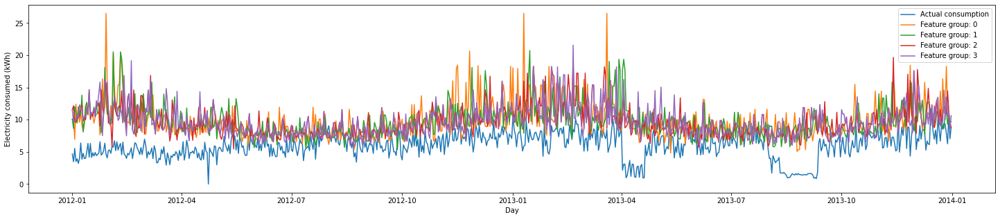

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.8436331048112784      4.398713916876215       22.977923953859086      4.793529383852683       -4.947155242726137     
1               3.762732150131878       3.6513647178504276      21.526211751733285      4.639634872674065       -4.571422524176863     
2               3.7288432920236474      3.6177675344690536      20.904794931534568      4.572176170220759       -4.410587180323166     
3               3.722985356143702       3.6124124774886774      20.889092213905737      4.570458643714626       -4.4065229968199535    


In [ ]:
visualise_results(adversity_households_test[2], household_3_predictions)
get_performance(adversity_households_test[2], household_3_predictions)

#### Adversity households - mutual information 


-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.398829834343043       169768603662339.2       89.13451858243116       9.441107910750262       -0.036739368377306736  
1               6.39350942395731        171935273320048.88      88.8836709349551        9.427813687963669       -0.033821714972775974  
2               6.323098489822452       168480520363915.9       88.10774937440986       9.386572823688626       -0.02479683391229126   
3               6.506002768907045       174450674628561.72      90.89431626398034       9.533851072047451       -0.05720788681277589   


<Figure size 432x288 with 0 Axes>

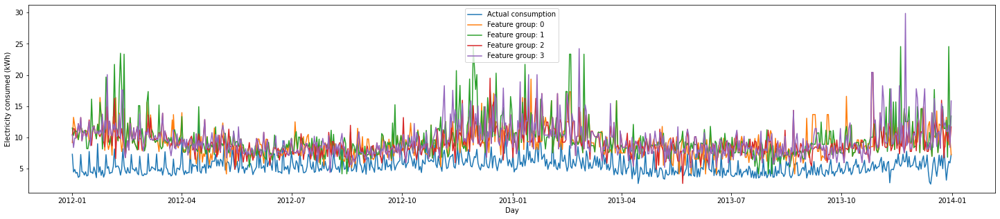

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.697310139427012       0.7475505450382246      18.771222922425924      4.332576937854182       -9.479572734188638     
1               4.272290403756253       0.8482474032755446      26.639683749481744      5.161364523987987       -13.872366314234673    
2               3.67694160854934        0.7388926849537706      17.97246620011971       4.239394555843996       -9.033643920550732     
3               4.122123327403365       0.8174237489695074      23.866394895577304      4.885324441178631       -12.324098394903489    


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, individual_feature_groups_mutual_information, adversity_households_test)


visualise_results(adversity_households_test[0], household_1_predictions)
get_performance(adversity_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

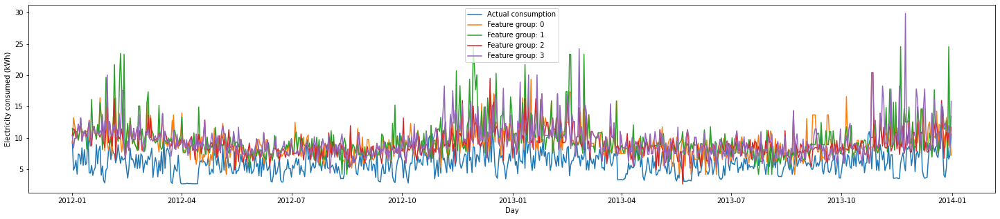

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.2857095965438834      0.664235962339545       16.078386774522436      4.009786375172927       -3.967964989259909     
1               3.8648857673578894      0.7658517662216586      23.793159814095016      4.87782326597582        -6.351706772447683     
2               3.287643202455661       0.6631192433857553      15.496827479782246      3.9366010059164296      -3.7882724457252506    
3               3.713777354579354       0.7405692466485919      21.17043622719911       4.601134232686448       -5.541327028576144     


In [ ]:
visualise_results(adversity_households_test[1], household_2_predictions)
get_performance(adversity_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

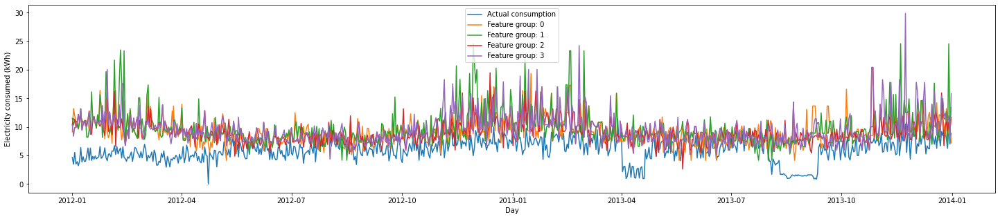

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               3.2736137333969983      3.2025330960679463      16.729057189530135      4.090117014161103       -3.329821108746004     
1               3.8088302874033655      3.65972279346576        23.638882320903296      4.861983373161954       -5.118224745161778     
2               3.2209665301409736      3.5211261640319473      15.722219964936848      3.9651254664810858      -3.0692311054525963    
3               3.6534739428376537      3.982057330880824       21.040454419936758      4.586987510331455       -4.445698622039864     


In [ ]:
visualise_results(adversity_households_test[2], household_3_predictions)
get_performance(adversity_households_test[2], household_3_predictions)

### 1.3.1 Finding the best value for K - after getting best feature group

-- Model performance per K: --

K Neighbors     MAE                     MAPE                    MSE                     RMSE                    R2                     
5               7.43374849941447        182837656197625.7       114.78103197056387      10.713590993246097      -0.3350385067352899    
6               7.232206522166975       181855823213673.7       107.72983076267711      10.379298182568855      -0.25302473695422223   
7               7.049937366569514       178703190568389.9       103.22365168805074      10.159904118054005      -0.20061257024349066   
8               6.934010377744781       177274321332089.88      100.36144752966084      10.018056075390117      -0.1673217668765341    
9               6.878355184253333       176658066551255.06      99.17192452443922       9.958510155863639       -0.153486214178022     
10              6.770695931913853       175376786445371.7       96.47166036990397       9.821998797083207       -0.12207896367006277   
11              

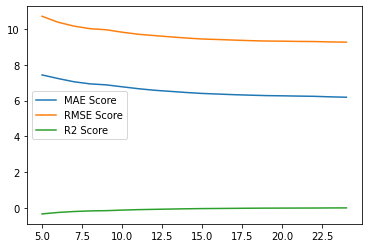

In [ ]:
#Fit the model and visualise the best results 

k = range(5, 25)

optimise_k(k, X_train[mutual_information_0], X_test[mutual_information_0], y_train, y_test)

## Affluent dataset only


### 1.1 Load the full dataset

In [ ]:
X_train = pd.read_csv(full_path + '/daily/daily_affluent_training.csv')
y_train = X_train['energy_sum']

X_test = pd.read_csv(full_path + '/daily/daily_affluent_testing.csv')
y_test = X_test['energy_sum']

#Drop the unneeded energy_sum column in the X dataset
X_train.drop(['energy_sum'], axis=1, inplace=True)
X_test.drop(['energy_sum'], axis=1, inplace=True)

#Check layout
X_train.head()

,LCLid,day_x,day_of_week,day_of_month,month,Acorn_grouped_Adversity,Acorn_grouped_Affluent,Acorn_grouped_Comfortable,temperatureLow,temperatureHigh,dewPoint,cloudCover,windSpeed,pressure,visibility,humidity,uvIndex,moonPhase,weather_type_clear-day,weather_type_cloudy,weather_type_fog,weather_type_partly-cloudy-day,weather_type_partly-cloudy-night,weather_type_wind,public_holiday,day_y
0,MAC004552,2012-01-01,6,1,1,0.0,1.0,0.0,5.18,12.56,9.45,0.58,4.92,1004.82,12.33,0.90,1.0,0.26,0.0,0.0,0.0,1.0,0.0,0.0,0,733
1,MAC004552,2012-01-02,0,2,1,0.0,1.0,0.0,4.69,7.57,2.80,0.21,4.81,1008.49,13.23,0.81,1.0,0.29,0.0,0.0,0.0,1.0,0.0,0.0,1,733
2,MAC004552,2012-01-03,1,3,1,0.0,1.0,0.0,5.27,12.41,5.73,0.48,8.47,1003.23,10.80,0.82,1.0,0.32,0.0,0.0,0.0,0.0,0.0,1.0,0,733
3,MAC004552,2012-01-04,2,4,1,0.0,1.0,0.0,8.16,8.21,3.38,0.49,7.98,1014.07,12.62,0.78,1.0,0.35,0.0,0.0,0.0,0.0,0.0,1.0,0,733
4,MAC004552,2012-01-05,3,5,1,0.0,1.0,0.0,4.40,11.04,4.28,0.47,9.49,1004.74,12.92,0.70,1.0,0.38,0.0,0.0,0.0,0.0,0.0,1.0,0,733


### 1.2 Fit and Plot results

#### Affluent households - Pearson

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               8.038129283855318       186671599070059.6       146.18495222639265      12.090696928895069      -0.0532733583919307    
1               8.281463297475414       197142807842797.84      147.12449168453816      12.129488517020746      -0.06004280945615559   
2               7.982385933785563       184389682908430.6       142.79440948401256      11.949661479891912      -0.028844247962647174  
3               8.062584148766927       187599871831779.53      144.03960864232377      12.00165024662541       -0.03781599970156857   


<Figure size 432x288 with 0 Axes>

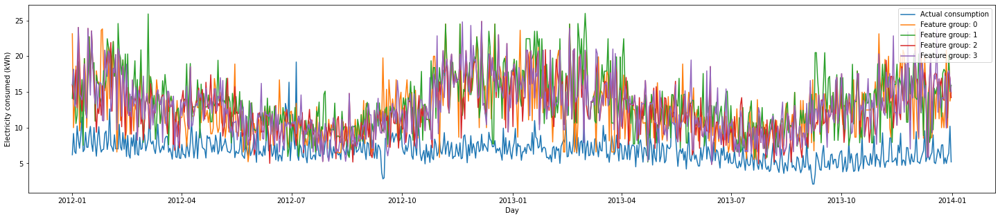

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.997567075216007       0.9710109840565823      50.60592745951741       7.1137843275936765      -15.775089404229568    
1               6.692080309549795       1.0692844767344785      60.17237058574758       7.7570851861860834      -18.946218692421432    
2               5.884806365138701       0.9428140013160683      48.03139827235819       6.930468834960459       -14.92167243399534     
3               6.140543154834016       0.9834589377549232      51.92603877837729       7.205972438080601       -16.212686075392742    


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, acorn_groups_pearson, affluent_households_test)

#Pearson on individual results - all
visualise_results(affluent_households_test[0], household_1_predictions)

get_performance(affluent_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

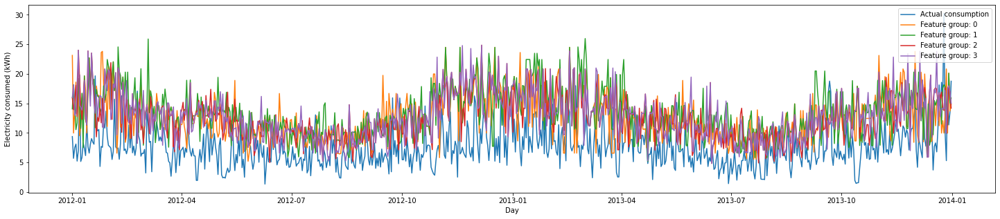

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.657997182355616       1.0146985094092666      46.23321457721505       6.79950105354908        -2.9313441590991003    
1               6.203553617107778       1.1216801240379666      54.58986099495339       7.388495177974565       -3.641934010669205     
2               5.408364440118236       0.982249709425321       42.46573486856381       6.516573859672259       -2.6109844462265754    
3               5.705379448603911       1.0254020529589845      46.53141366898754       6.821393821572505       -2.9567008916648296    


In [ ]:
visualise_results(affluent_households_test[1], household_2_predictions)
get_performance(affluent_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

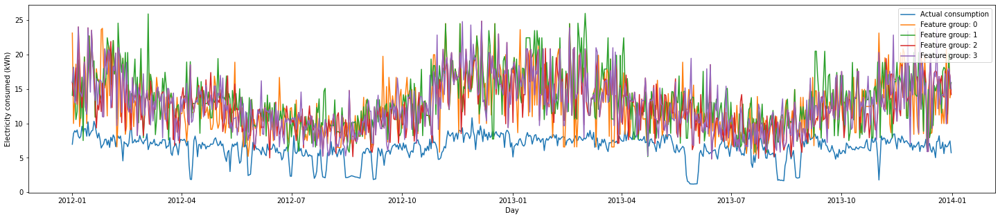

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.147562892905866       1.1439294867973886      50.45498948370524       7.103167566917258       -16.505115094284363    
1               6.841693589504322       1.2537216163328633      60.523255087207296      7.779669343050982       -19.998251253713107    
2               6.034824739245112       1.1066070051477375      47.90726127166767       6.92150715319053        -15.621193087025272    
3               6.258422556625739       1.1456123620108623      51.382069549505424      7.1681287341610584      -16.826761048817563    


In [ ]:
visualise_results(affluent_households_test[2], household_3_predictions)
get_performance(affluent_households_test[2], household_3_predictions)

#### Affluent households - Mutual information 

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               8.025567374629803       187255474533121.62      142.76474809489332      11.948420317970628      -0.02863053546723382   
1               8.131468076002992       188231367330147.78      144.10002640380813      12.004167043314922      -0.03825131412741034   
2               8.023924616198196       181250535701706.12      144.8919868557181       12.037108741542468      -0.0439574475713298    
3               7.8019986156474195      176958539019120.72      141.46335119543656      11.89383668945545       -0.0192538748601363    


<Figure size 432x288 with 0 Axes>

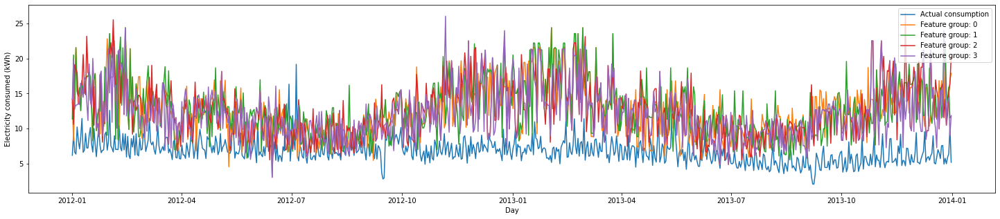

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.891555795916325       0.9480162240650531      47.43624780440002       6.887397752736517       -14.724389174698217    
1               6.153533875661664       0.9804778569753665      51.127173380161096      7.15032680233296        -15.947874438697763    
2               5.866364526757618       0.9367413014376771      48.55783814232674       6.968345437930495       -15.096179183066145    
3               5.511475215434288       0.8804879808628129      42.83150985708618       6.544578661540114       -13.197989113933977    


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, acorn_groups_mutual_information, affluent_households_test)

#Pearson on individual results - all
visualise_results(affluent_households_test[0], household_1_predictions)

get_performance(affluent_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

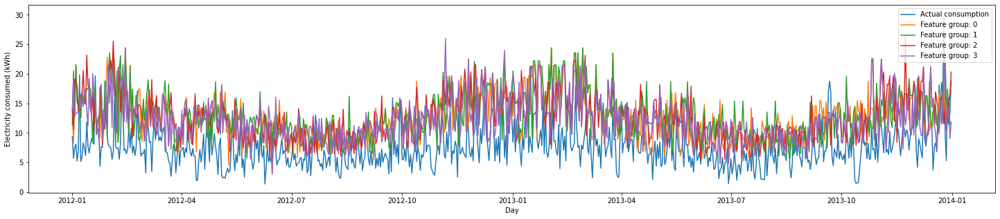

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.408234741982719       0.9685425332066191      41.10028077485015       6.41095006803595        -2.494875929331783     
1               5.683864300545703       1.019553275186619       45.078791262323314      6.714074118024265       -2.833180200619689     
2               5.422909775034107       0.972138538715003       42.94383415709816       6.553154519549967       -2.6516386136392662    
3               5.140310959718054       0.9318393260429567      37.92808280155736       6.15857798534348        -2.225134746767405     


In [ ]:
visualise_results(affluent_households_test[1], household_2_predictions)
get_performance(affluent_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

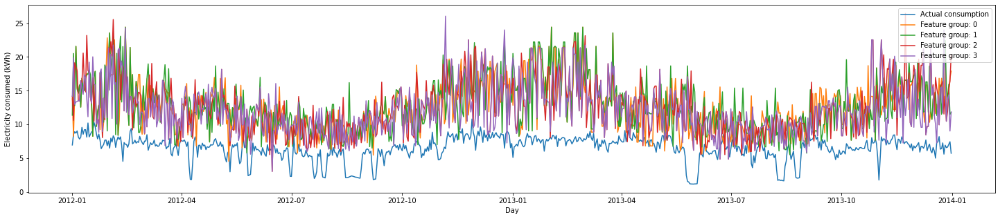

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               6.020240472014553       1.0905047178925589      46.97199053561863       6.853611495818728       -15.296705418979244    
1               6.239290493551615       1.1549324905970737      51.47733820147955       7.174770951150952       -16.859814047832117    
2               6.016149157180537       1.1069156212073639      48.44806263278291       6.960464254112861       -15.808821509235631    
3               5.644323055825376       1.0473087126760472      43.31005990927981       6.581037905169656       -14.0262162614689      


In [ ]:
visualise_results(affluent_households_test[2], household_3_predictions)
get_performance(affluent_households_test[2], household_3_predictions)

#### Save best result

In [ ]:
household_1_predictions, household_2_predictions, household_3_predictions

#Household1
save_best_results(household_1_predictions, 3, "affluent", "household_1")
save_best_results(household_2_predictions, 3, "affluent", "household_2")
save_best_results(household_3_predictions, 3, "affluent", "household_3")

## Comfortable dataset only


### 1.1 Load the full dataset

In [ ]:
X_train = pd.read_csv(full_path + '/daily/daily_comfortable_training.csv')
y_train = X_train['energy_sum']

X_test = pd.read_csv(full_path + '/daily/daily_comfortable_testing.csv')
y_test = X_test['energy_sum']

#Drop the unneeded energy_sum column in the X dataset
X_train.drop(['energy_sum'], axis=1, inplace=True)
X_test.drop(['energy_sum'], axis=1, inplace=True)

#Check layout
X_train.head()

,LCLid,day_x,day_of_week,day_of_month,month,Acorn_grouped_Adversity,Acorn_grouped_Affluent,Acorn_grouped_Comfortable,temperatureLow,temperatureHigh,dewPoint,cloudCover,windSpeed,pressure,visibility,humidity,uvIndex,moonPhase,weather_type_clear-day,weather_type_cloudy,weather_type_fog,weather_type_partly-cloudy-day,weather_type_partly-cloudy-night,weather_type_wind,public_holiday,day_y
0,MAC000241,2012-01-01,6,1,1,0.0,0.0,1.0,5.18,12.56,9.45,0.58,4.92,1004.82,12.33,0.90,1.0,0.26,0.0,0.0,0.0,1.0,0.0,0.0,0,419
1,MAC000241,2012-01-02,0,2,1,0.0,0.0,1.0,4.69,7.57,2.80,0.21,4.81,1008.49,13.23,0.81,1.0,0.29,0.0,0.0,0.0,1.0,0.0,0.0,1,419
2,MAC000241,2012-01-03,1,3,1,0.0,0.0,1.0,5.27,12.41,5.73,0.48,8.47,1003.23,10.80,0.82,1.0,0.32,0.0,0.0,0.0,0.0,0.0,1.0,0,419
3,MAC000241,2012-01-04,2,4,1,0.0,0.0,1.0,8.16,8.21,3.38,0.49,7.98,1014.07,12.62,0.78,1.0,0.35,0.0,0.0,0.0,0.0,0.0,1.0,0,419
4,MAC000241,2012-01-05,3,5,1,0.0,0.0,1.0,4.40,11.04,4.28,0.47,9.49,1004.74,12.92,0.70,1.0,0.38,0.0,0.0,0.0,0.0,0.0,1.0,0,419


### 1.2 Fit and Plot results

#### Comfortable households - Pearson

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.164829662654916       93051823196309.83       60.868770804976506      7.801844064384811       -0.005031747959421962  
1               5.251032663945549       91114531237934.23       61.555352366375494      7.845721914927618       -0.016368206009156783  
2               5.299463584131855       93503821508592.98       63.07752614163627       7.942136119561051       -0.04150150424759036   
3               5.2654374814730565      91790770098989.95       62.70257180303233       7.9184955517467035      -0.03531046392677473   


<Figure size 432x288 with 0 Axes>

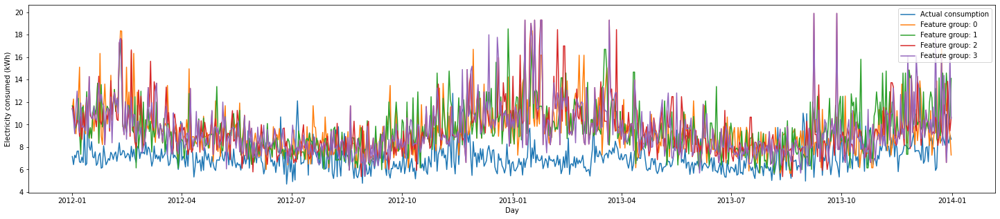

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.5736756710050024      0.37928395453484454     10.485137892764488      3.2380762641983107      -6.6981035233003485    
1               2.7323989083128697      0.4023571570463197      11.331632402188502      3.3662490107222465      -7.31959295263329      
2               2.7287571623829017      0.40114825951612776     12.03170503492571       3.4686748240395366      -7.83358062315877      
3               2.682257935843565       0.39399506810862545     11.743857002111453      3.4269311347197293      -7.62224492321422      


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, acorn_groups_pearson, comfortable_households_test)

#Pearson on individual results - all
visualise_results(comfortable_households_test[0], household_1_predictions)

get_performance(comfortable_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

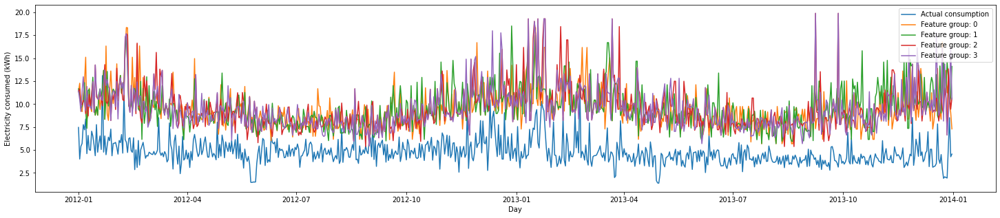

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               4.656754160181901       1.1289423429292362      26.59259327231317       5.156800681848502       -12.57271277551318     
1               4.843821735734425       1.1756910285756093      28.7479506774189        5.361711543660187       -13.67279529429984     
2               4.796454478917689       1.1555763591995285      28.64940133127132       5.3525135526471415      -13.622496252165114    
3               4.754038199408822       1.1446376286929476      28.09354962077299       5.300334859305871       -13.338792608255124    


In [ ]:
visualise_results(comfortable_households_test[1], household_2_predictions)
get_performance(comfortable_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

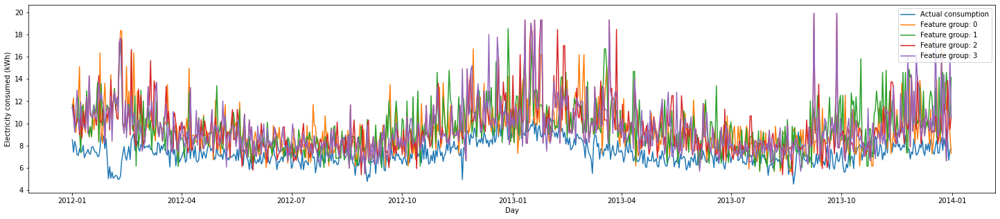

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.1613424281673486      0.3039465520258308      8.022136178462748       2.832337582009381       -6.1604542456578315    
1               2.3302222825557073      0.3268757749318958      8.892499365442744       2.9820294038528097      -6.937329087823555     
2               2.2975697136516597      0.32050580463940875     9.25682434315614        3.0425029734013638      -7.262520816738705     
3               2.285914324802183       0.3192505556101332      9.199725664020557       3.033104954336489       -7.2115552795872055    


In [ ]:
visualise_results(comfortable_households_test[2], household_3_predictions)
get_performance(comfortable_households_test[2], household_3_predictions)

#### Comfortable households - Mutual information 

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.1724698965440945      90300982344546.14       61.64949845064549       7.8517194582234975      -0.017922694499495684  
1               5.188186564242328       90296313248626.33       61.65164779472688       7.8518563279473526      -0.017958183289732643  
2               5.330202728320283       93889960453374.73       63.41465570711008       7.963331947565044       -0.04706800266699407   
3               5.28274933727613        92903895593301.3        62.75757887879575       7.92196811902167        -0.03621871058221937   


<Figure size 432x288 with 0 Axes>

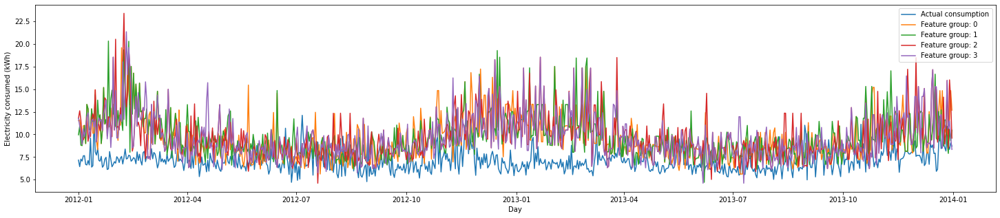

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.8251466126875853      0.41415065858358047     12.554992281477055      3.5433024541347096      -8.217773891532941     
1               2.808109139918145       0.4147524175549068      12.68502108487777       3.5616037237286475      -8.313239988386117     
2               2.8510008186539335      0.42003566594718666     13.657855370822373      3.6956535783028115      -9.02748706084336      
3               2.7952893125511595      0.41094446428801684     12.772830525435479      3.5739096974371747      -8.377708970162962     


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, acorn_groups_mutual_information, comfortable_households_test)

#Pearson on individual results - all
visualise_results(comfortable_households_test[0], household_1_predictions)

get_performance(comfortable_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

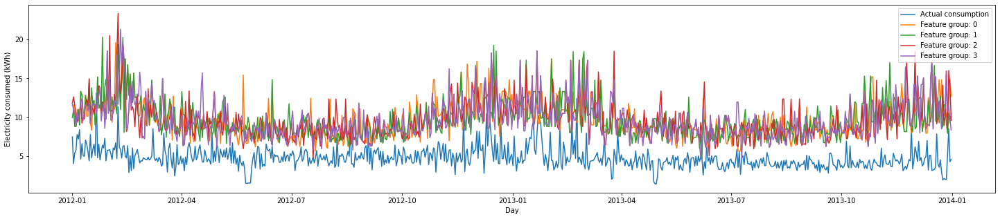

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               4.868749886202819       1.1608793301129738      29.288874516072088      5.411919670142202       -13.94887983484413     
1               4.954088220309232       1.1878579489089178      30.166852937361767      5.492435974807696       -14.396995173323369    
2               4.9730881302592085      1.190171756935056       31.01068725363536       5.5687240238348465      -14.82768354912865     
3               4.904603545829922       1.1787718355277519      30.275794691541417      5.5023444722719255      -14.452598443136111    


In [ ]:
visualise_results(comfortable_households_test[1], household_2_predictions)
get_performance(comfortable_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

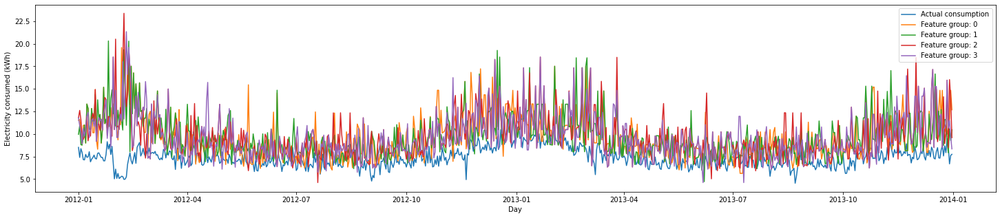

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.3746884034106412      0.3318200534009091      9.790847786865507       3.129033043428194       -7.739183185679233     
1               2.4186937690950434      0.33848663673777285     10.041695939363697      3.168863509109172       -7.963086978710489     
2               2.4747619824192815      0.34745076474754005     11.106224156699136      3.3326002095509653      -8.913270997514168     
3               2.4097429734333784      0.33739990275660414     10.35512464620028       3.217937949401803       -8.242849359284927     


In [ ]:
visualise_results(comfortable_households_test[2], household_3_predictions)
get_performance(comfortable_households_test[2], household_3_predictions)

#### Save best result

In [ ]:
household_1_predictions, household_2_predictions, household_3_predictions

#Household1
save_best_results(household_1_predictions, 0, "comfortable", "household_1")
save_best_results(household_2_predictions, 0, "comfortable", "household_2")
save_best_results(household_3_predictions, 0, "comfortable", "household_3")

## Adversity dataset only

### 1.1 Load the full dataset

In [ ]:
X_train = pd.read_csv(full_path + '/daily/daily_adversity_training.csv')
y_train = X_train['energy_sum']

X_test = pd.read_csv(full_path + '/daily/daily_adversity_testing.csv')
y_test = X_test['energy_sum']

#Drop the unneeded energy_sum column in the X dataset
X_train.drop(['energy_sum'], axis=1, inplace=True)
X_test.drop(['energy_sum'], axis=1, inplace=True)

#Check layout
X_train.head()

,LCLid,day_x,day_of_week,day_of_month,month,Acorn_grouped_Adversity,Acorn_grouped_Affluent,Acorn_grouped_Comfortable,temperatureLow,temperatureHigh,dewPoint,cloudCover,windSpeed,pressure,visibility,humidity,uvIndex,moonPhase,weather_type_clear-day,weather_type_cloudy,weather_type_fog,weather_type_partly-cloudy-day,weather_type_partly-cloudy-night,weather_type_wind,public_holiday,day_y
0,MAC000102,2012-01-01,6,1,1,1.0,0.0,0.0,5.18,12.56,9.45,0.58,4.92,1004.82,12.33,0.90,1.0,0.26,0.0,0.0,0.0,1.0,0.0,0.0,0,733
1,MAC000102,2012-01-02,0,2,1,1.0,0.0,0.0,4.69,7.57,2.80,0.21,4.81,1008.49,13.23,0.81,1.0,0.29,0.0,0.0,0.0,1.0,0.0,0.0,1,733
2,MAC000102,2012-01-03,1,3,1,1.0,0.0,0.0,5.27,12.41,5.73,0.48,8.47,1003.23,10.80,0.82,1.0,0.32,0.0,0.0,0.0,0.0,0.0,1.0,0,733
3,MAC000102,2012-01-04,2,4,1,1.0,0.0,0.0,8.16,8.21,3.38,0.49,7.98,1014.07,12.62,0.78,1.0,0.35,0.0,0.0,0.0,0.0,0.0,1.0,0,733
4,MAC000102,2012-01-05,3,5,1,1.0,0.0,0.0,4.40,11.04,4.28,0.47,9.49,1004.74,12.92,0.70,1.0,0.38,0.0,0.0,0.0,0.0,0.0,1.0,0,733


### 1.2 Fit and Plot results

#### Adversity households - Pearson

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.00469569638067        197686561645363.94      45.06959665987096       6.713389357088635       -0.06492709105675942   
1               5.063628469565286       203641959213358.66      45.23242432510619       6.72550550703114        -0.06877446500135265   
2               4.88828382807417        192046032717366.5       43.913502503103935      6.626726379073149       -0.03761031703180295   
3               4.973526425532703       195262501725514.5       44.44950275256747       6.667046028982211       -0.050275200429242606  


<Figure size 432x288 with 0 Axes>

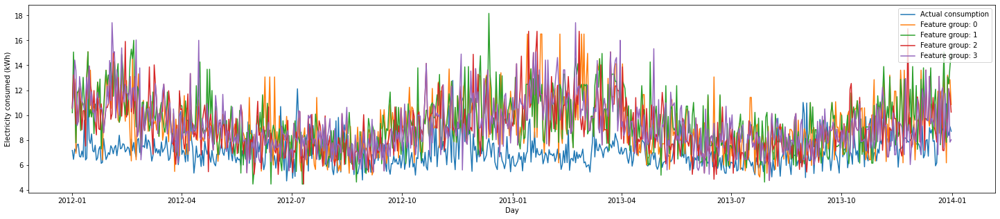

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.513519964283766       0.36803930667537516     9.812039873944611       3.132417576560413       -6.203920396364131     
1               2.6944809468303776      0.39406151110202875     10.980479054354253      3.3136805902733375      -7.061779001893839     
2               2.3400780350613917      0.34262605076939445     8.620822666055172       2.93612374842328        -5.329338347100122     
3               2.5060844013915418      0.3697583296889853      9.791481049630342       3.129134233239338       -6.1888262736632935    


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, acorn_groups_pearson, adversity_households_test)

#Pearson on individual results - all
visualise_results(comfortable_households_test[0], household_1_predictions)

get_performance(comfortable_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

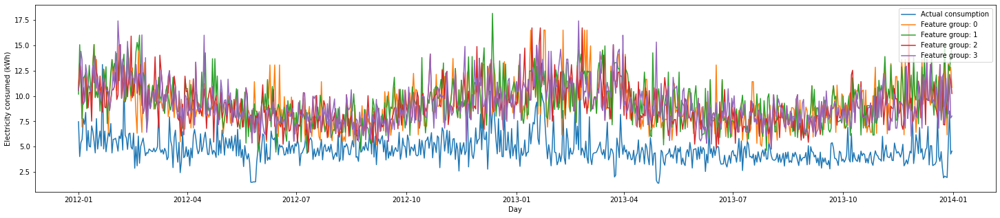

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               4.488818553615279       1.0842802635722226      25.171777226065007      5.017148316131885       -11.847536110526377    
1               4.678311232169167       1.1312932392556365      27.30412150216409       5.225334582796023       -12.935872855334754    
2               4.3154024545520695      1.0378413232588874      23.113475527830648      4.807647608532748       -10.796990288634976    
3               4.50341809895407        1.0889962363608354      25.174135382012533      5.01738332021907        -11.848739700301465    


In [ ]:
visualise_results(comfortable_households_test[1], household_2_predictions)
get_performance(comfortable_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

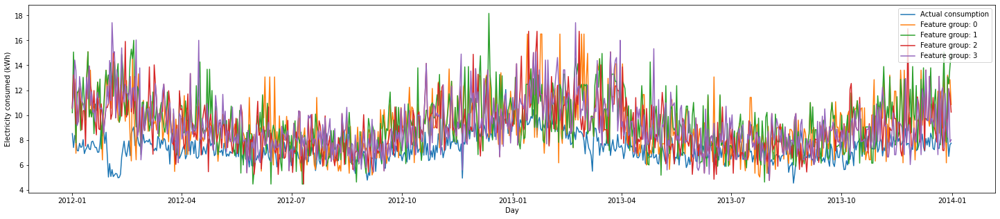

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.207272943183265       0.3079298564525112      7.829125994048694       2.798057539445659       -5.988175869462571     
1               2.3333999097589815      0.32621600874791146     8.725193468858444       2.9538438463904018      -6.7879940240861805    
2               1.9346168257116871      0.27057017115071036     6.500596813899866       2.549626798945263       -4.802348030486655     
3               2.06076743899045        0.28914052228517273     7.352939157395524       2.71163035043413        -5.563137702522235     


In [ ]:
visualise_results(comfortable_households_test[2], household_3_predictions)
get_performance(comfortable_households_test[2], household_3_predictions)

#### Adversity households - Mutual information 

-- Model performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               5.067348611354855       202044068118034.06      45.62772289192535       6.754829597549101       -0.0781147782958902    
1               4.983728315715052       195820574346559.94      45.17140236319393       6.720967368109588       -0.06733260740319813   
2               4.955241374937352       195738746002455.97      44.582285456314885      6.67699673927694        -0.05341265691707253   
3               4.872508072277596       191806451677126.84      43.95329562628619       6.629728171372201       -0.038550568954498265  


<Figure size 432x288 with 0 Axes>

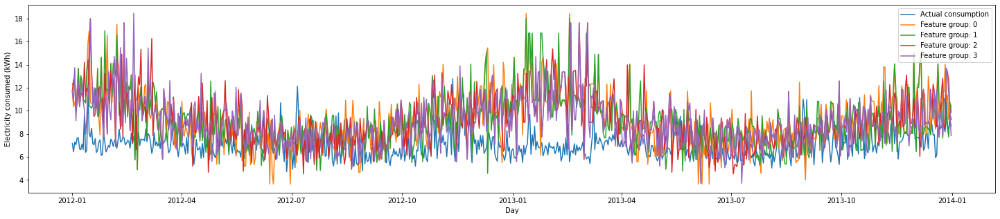

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.546672031723511       0.37441917025735005     10.349015451882567      3.216988568814407       -6.598163527043698     
1               2.4581849017280586      0.3630248579725939      9.934904563695016       3.151968363371532       -6.294126658859686     
2               2.475758070904957       0.36485394008446626     9.838498250175501       3.1366380489587096      -6.223345922415093     
3               2.340825283392451       0.3457270613623428      8.999004533538928       2.9998340843351534      -5.6069964185818515    


In [ ]:
#Pass in the dataset, run the model and then plot the results

household_1_predictions, household_2_predictions, household_3_predictions = run_model(X_train, X_test, y_train, y_test, 15, acorn_groups_mutual_information, adversity_households_test)

#Pearson on individual results - all
visualise_results(comfortable_households_test[0], household_1_predictions)

get_performance(comfortable_households_test[0], household_1_predictions)

<Figure size 432x288 with 0 Axes>

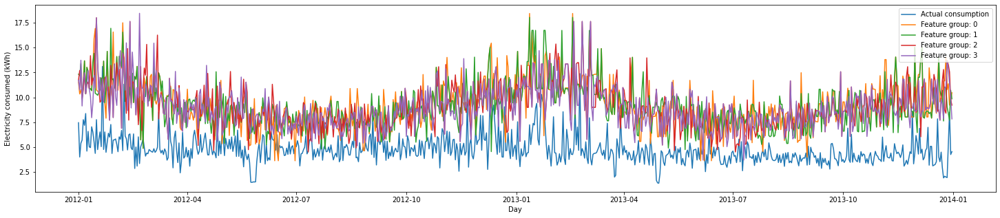

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               4.529306502328331       1.0842212768206287      25.848342485825253      5.0841265214218705      -12.192851283461277    
1               4.4235729872487495      1.0629798785466131      24.56708632503888       4.956519577792353       -11.538905213435987    
2               4.422951340854934       1.0713899559338642      24.858072582379194      4.985787057464368       -11.687422992505455    
3               4.278377989758981       1.0362663736887479      23.074837048521843      4.803627488525921       -10.77726942213765     


In [ ]:
visualise_results(comfortable_households_test[1], household_2_predictions)
get_performance(comfortable_households_test[1], household_2_predictions)

<Figure size 432x288 with 0 Axes>

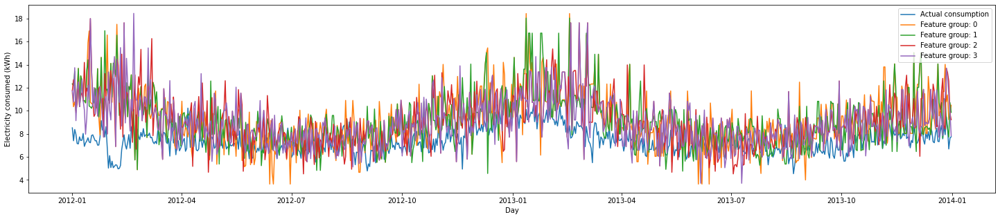

-- Household forecasting performance per feature group: --

Feature group   MAE                     MAPE                    MSE                     RMSE                    R2                     
0               2.225771986412006       0.31054675517761265     8.202753949236401       2.864045032683041       -6.321671314878076     
1               2.0461296033196907      0.28565523666119846     7.2757667395639185      2.697362923220366       -5.49425460771844      
2               2.142289767567076       0.2984824471781434      7.481353468573991       2.735206293604559       -5.67775864378096      
3               1.944048384820373       0.27320944883479625     6.669652866317118       2.5825671078051617      -4.9532452605206165    


In [ ]:
visualise_results(comfortable_households_test[2], household_3_predictions)
get_performance(comfortable_households_test[2], household_3_predictions)

#### Save best result

In [ ]:
household_1_predictions, household_2_predictions, household_3_predictions

save_best_results(household_1_predictions, 2, "adversity", "household_1")
save_best_results(household_2_predictions, 2, "adversity", "household_2")
save_best_results(household_3_predictions, 2, "adversity", "household_3")